### Extracting nanotube profiles from SEM images

Goals:

* Find a Python package to crop/rotate and look at individual line scans from SEM images
* Average over many lines scans to get an idea of what a nanotube profile looks like in the SEM
* Do this for many different images/tubes
* Propose a model with just one fitting parameter to match the measured profile

In [1]:
import os, glob, shutil, random

Don't run the code between the horizontal rules again
****

In [135]:
# first I'm going to compile all of the images I have to work with
# these are all of the images of the same type that I have

sample_dir = '/Users/nik/Dropbox/Samples/'
imgs = [] # this is the list of all of the images I want

check = ('leads','complete','combined','edit','after', 'ann') #tags I want to avoid
samp = ('sc','gd','cnt') #samples I want to find

for root, dirs, files in os.walk(sample_dir):
    for f in files:
        name = root.split('/')[5].lower() #this should be the sample name
        search = ('sc','gd','cnt')
        if (f.endswith('.tif') and name.startswith(samp)):
            if not any(c in f for c in check):
                imgs.append(os.path.join(root, f))
                
print len(imgs)

609


In [136]:
# copy all images into directory
# don't run this cell again unless 

img_dir = '/Users/nik/Dropbox/cnt_filter/original'
for f in imgs:
    dest = os.path.join(img_dir,f.split('/')[-1])
    shutil.copy(f, dest)

In [138]:
# select a random sample
# commented out so I do not run it again

#test_dir = '/Users/nik/Dropbox/cnt_filter/test'
#filelist = random.sample(os.listdir(img_dir), 25)
#for f in filelist:
#    src = os.path.join(img_dir, f)
#    dest = os.path.join(test_dir, f)
#    shutil.copy(src, dest)

****

Ok. Now that all of the files are handled I will just work in the test directory.

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import numpy as np
import pandas as pd
from scipy import ndimage 
from skimage import io, img_as_float
from skimage.transform import rotate

In [3]:
# some useful functions

def normalize(image_array):
    # image_array = image_array.astype(np.float)
    image_array = image_array - image_array.min()
    return (image_array/image_array.max())*1.0

def color_limits(image_array):
    """ returns limits for color scale of image """
    return image_array.mean()-0.25, image_array.mean()+0.25 #sort of empirically determined

In [4]:
img_dir = '/Users/nik/Dropbox/cnt_filter/original'
test_dir = '/Users/nik/Dropbox/cnt_filter/test'
os.chdir(test_dir)
filelist = glob.glob('*.tif')

In [5]:
for i, f in enumerate(filelist):
    print '{0} -- {1}'.format(i,f)

0 -- cntal5_q2_1.tif
1 -- gd13_q3_2.tif
2 -- gd17_q3_4.tif
3 -- gd17_q4_5.tif
4 -- gd21_q2_8.tif
5 -- gd2_q3_2.tif
6 -- gd3_q2_1.tif
7 -- gdcr2_1.tif
8 -- scf67_q2_2.tif
9 -- scf75_q4_3.tif
10 -- scf81_q2_2.tif
11 -- scf86_q4_3.tif
12 -- scf87_q3_3.tif
13 -- scfm13_q3_2.tif
14 -- scfm3_q2_3.tif
15 -- scfm5_q4_2.tif
16 -- scfma3_q3_3.tif
17 -- scfme7_q2_1.tif
18 -- scfmf5_q2_1.tif
19 -- scfmg1_q4_3.tif
20 -- scfmi4_q2_1.tif
21 -- scft10_q4_3.tif
22 -- scft11_q3_6.tif
23 -- scft7_q3_2.tif
24 -- scft_19_q4_3.tif


In [13]:
im = ndimage.imread(filelist[0])
print im.shape, im.dtype

(768, 1024) uint8


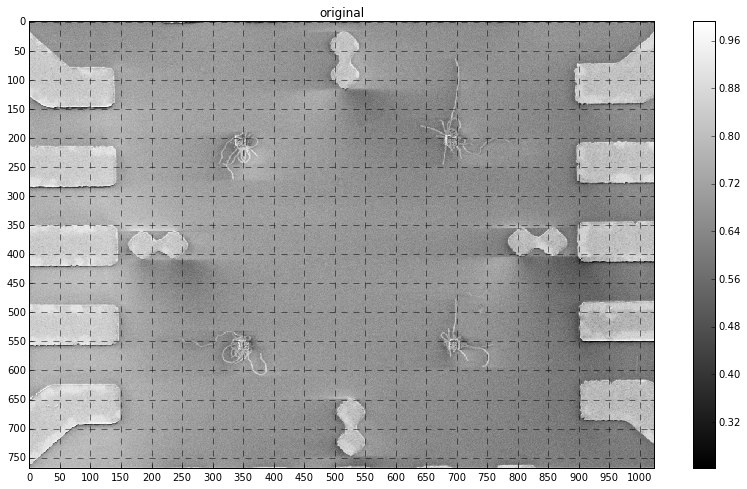

In [14]:
im = img_as_float(im)
fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(1,1,1)
# cmin, cmax = color_limits(im)
axim = ax.imshow(im, # vmin = cmin, vmax = cmax, 
                 cmap = plt.cm.gray, aspect = 'auto', interpolation = 'None')
ax.set_title('original')
ax.xaxis.set_major_locator(MultipleLocator(50))
ax.yaxis.set_major_locator(MultipleLocator(50))
ax.xaxis.grid(True, which="major", linestyle='--', color='k')
ax.yaxis.grid(True, which="major", linestyle='--', color='k')
cb = plt.colorbar(axim)

Alright. Here's what to do to build up a data set. Plot all 25 test images with some normalization to make them easier to look at. Then choose some subsections that look good from each plot and create a list of all of them.

/usr/local/lib/python2.7/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


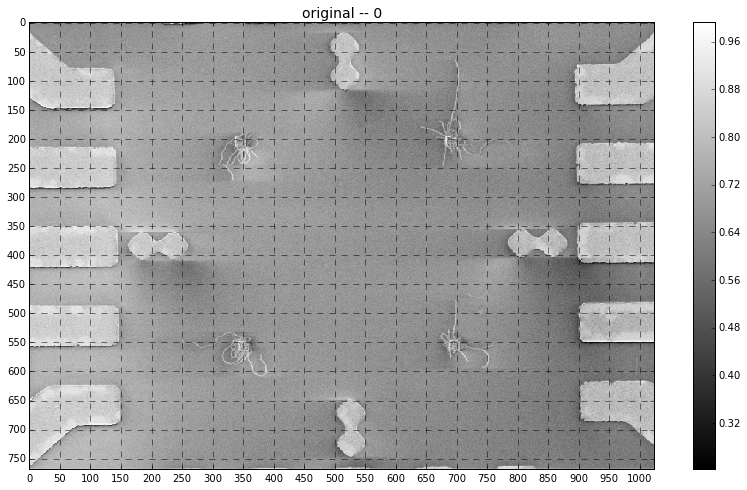

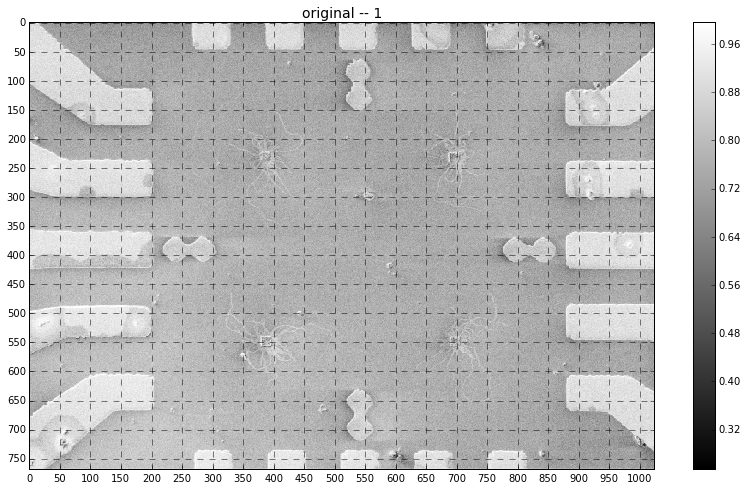

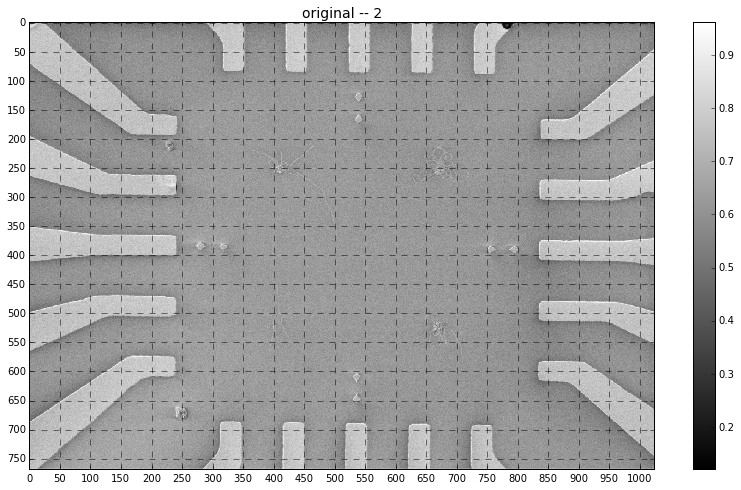

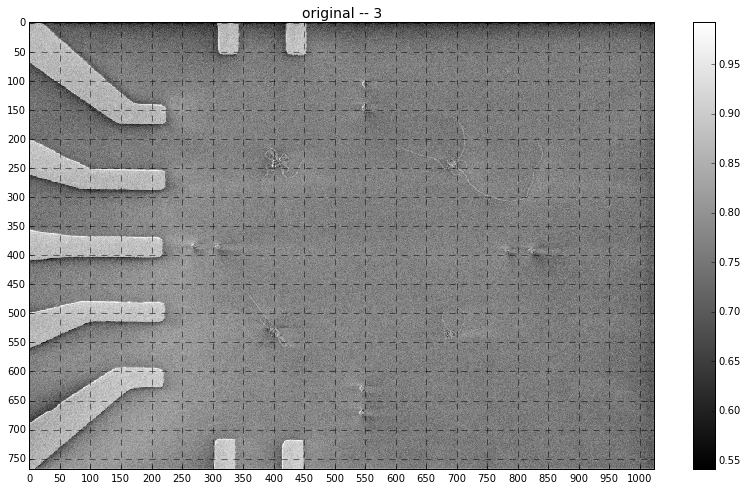

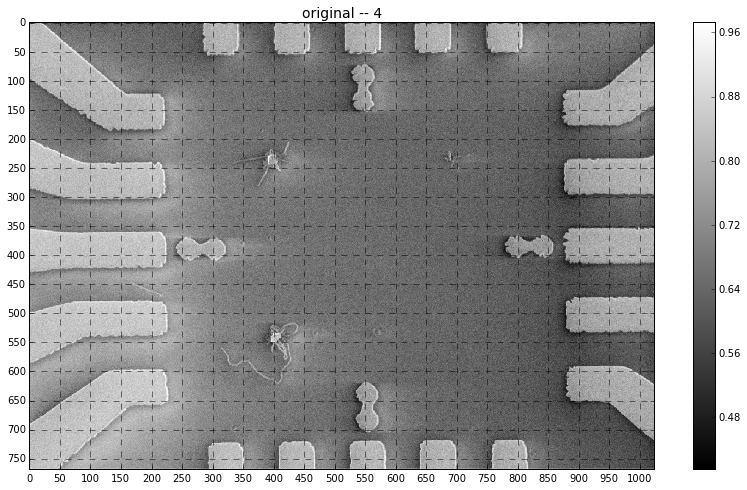

...

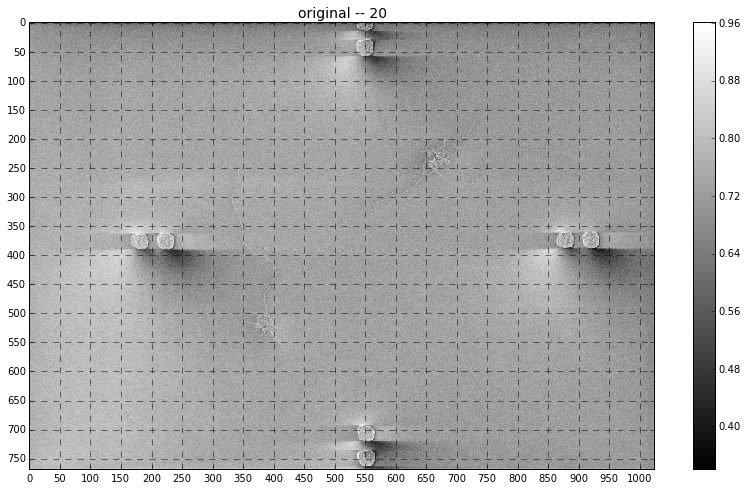

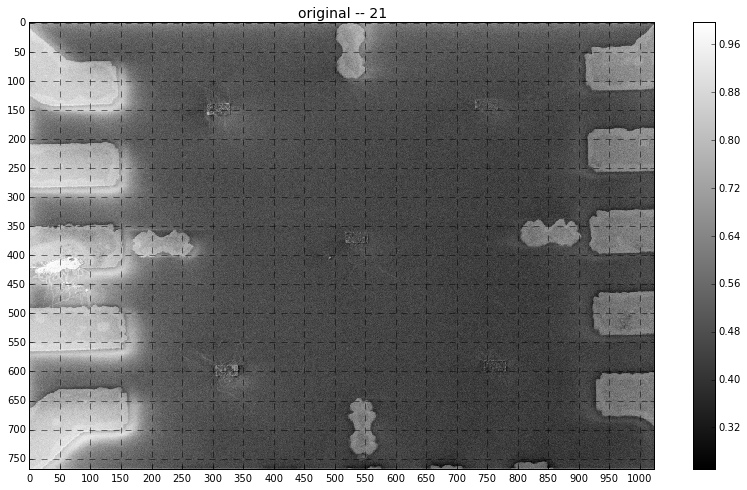

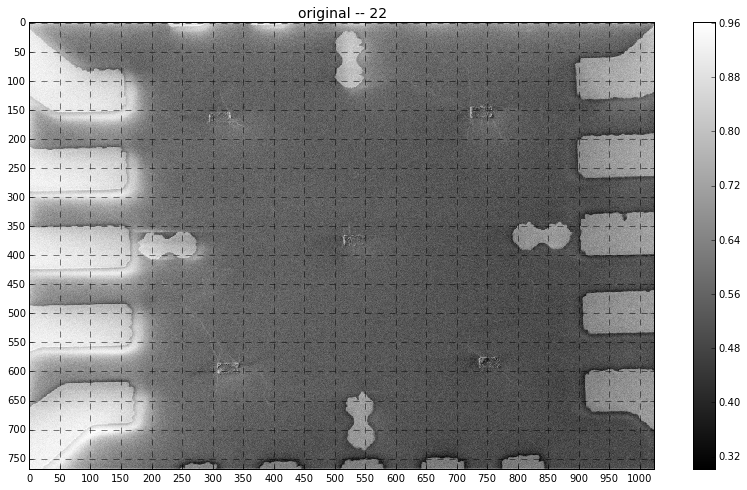

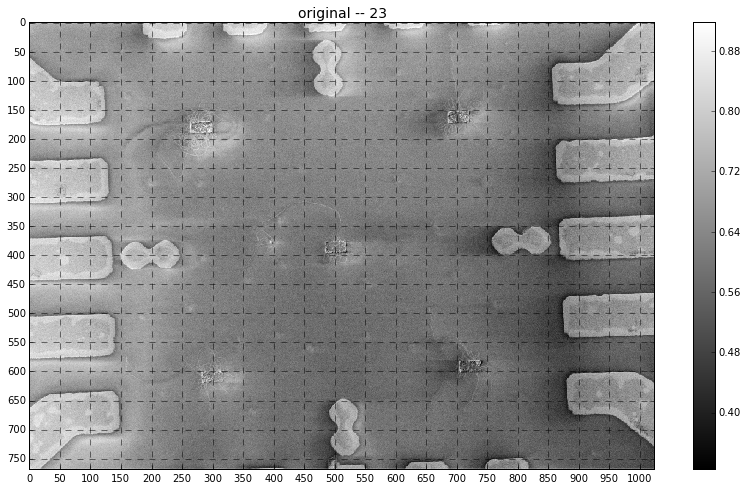

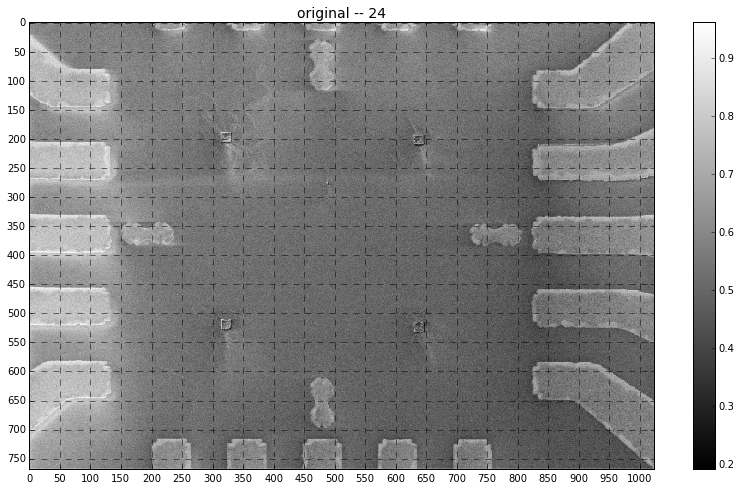

In [15]:
for i,f in enumerate(filelist):
    im = ndimage.imread(f)
    im = img_as_float(im)
    fig = plt.figure(figsize=(14,8))
    ax = fig.add_subplot(1,1,1)
    # cmin, cmax = color_limits(im)
    axim = ax.imshow(im, # vmin = cmin, vmax = cmax, 
                     cmap = plt.cm.gray, aspect = 'auto', interpolation = 'None')
    ax.set_title('original -- {0}'.format(i), fontsize = 14)
    ax.xaxis.set_major_locator(MultipleLocator(50))
    ax.yaxis.set_major_locator(MultipleLocator(50))
    ax.xaxis.grid(True, which="major", linestyle='--', color='k')
    ax.yaxis.grid(True, which="major", linestyle='--', color='k')
    cb = plt.colorbar(axim)

Great. Now I need to use these images to find some parameters for my nanotube profile filter. 

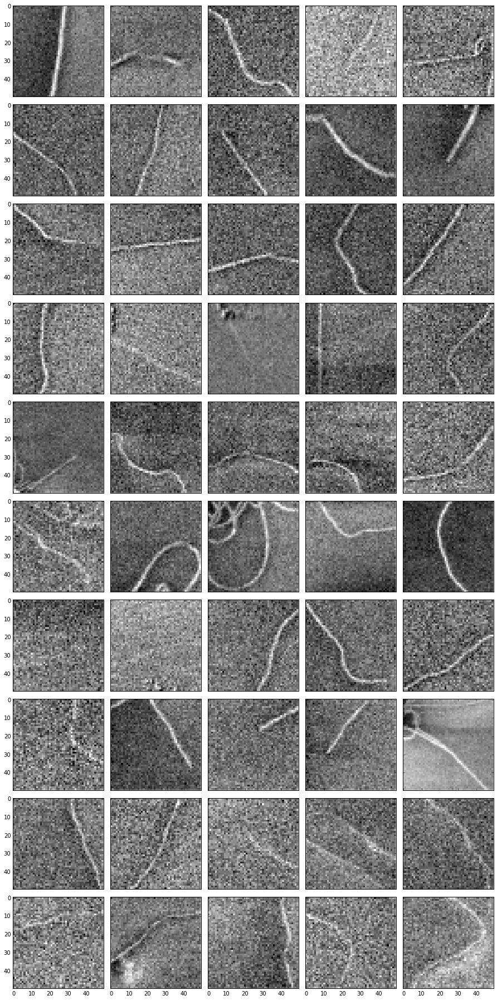

In [22]:
# putting together a test set of nanotube pieces
# choose square pieces because I'm interested in 
# finding profile (not length) information

cntloc = [(100,150,675,725), (175,225,750,800), #0
          (150,200,400,450), (550,600,450,500), #1
          (500,550,350,400), (250,300,450,500), #2
          (250,300,800,850), (450,500,350,400), #3
          (575,625,350,400), (250,300,350,400), #4
          (550,600,700,750), (200,250,600,650), #5
          (150,200,400,450), (150,200,500,550), #6
          (150,200,250,300), (400,450,600,650), #7
          (625,675,775,825), (125,175,725,775), #8
          (250,300,400,450), (550,600,650,700), #9
          (450,500,400,450), (200,250,750,800), #10
          (500,550,500,550), (100,150,650,700), #11
          (500,550,800,850), (200,250,700,750), #12
          (175,225,400,450), (550,600,650,700), #13
          (100,150,850,900), (600,650,375,425), #14
          (350,400,500,550), (150,200,650,700), #15
          (600,650,350,400), (300,350,750,800), #16
          (200,250,  0, 50), (300,350,650,700), #17
          (550,600,400,450), (550,600,350,400), #18
          (550,600,  0, 50), (450,500,650,700), #19
          (300,350,300,350), (150,200,700,750), #20
          (400,450,550,600), (550,600,250,300), #21
          (500,550,250,300), (500,550,750,800), #22
          (300,350,400,450), ( 50,100,650,700), #23
          (600,650,250,300), (100,150,350,400)] #24

fig, axs = plt.subplots(10,5,sharex = True, sharey=True, 
                        figsize=(5*2.5,10*2.5))

axs = axs.flat

tubes = np.zeros((50,50,50), dtype=np.float)

for i in range(len(cntloc)/2):
    im = img_as_float(ndimage.imread(filelist[i])) 
    for j in [2*i, 2*i+1]:
        cnt = cntloc[j]
        tubes[j] = im[cnt[0]:cnt[1],cnt[2]:cnt[3]]
        axs[j].imshow(tubes[j], cmap = plt.cm.gray, aspect = 'auto', interpolation = 'None')      
fig.tight_layout()
# fig.suptitle('Randomly Selected Nanotube Data Set')
# fig.savefig()

The magnification in these images is not the same, so the length scaling is not constant, but it is roughly 1px ~ 150nm.

Now look at each one individually to determine what angle to rotate by to get a vertical portion of the nanotube. It would be great to be able to average over a few lines for each profile. Aim for something like 2 profiles from each of the 50 images, each profile should be the average of 2-5 pixels.

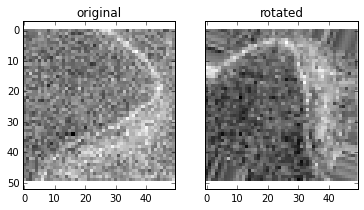

In [462]:
# the array 'tubes' now contains the 50x50px images which can be accessed by tubes[i,...]
# plot each image individually to find the rotation angle that gives a nice straight section

im = tubes[49,...] # check image as float

fig, axs = plt.subplots(1,2,sharex = True, sharey=True, 
                        figsize=(6,3))
axs = axs.flat

axs[0].imshow(im, cmap = plt.cm.gray, aspect = 'auto', interpolation = 'None')
axs[0].set_title('original')
axs[1].imshow(rotate(im, 70, resize=False, mode='nearest')# , cmap = plt.cm.gray, aspect = 'equal', interpolation = 'None')
axs[1].set_title('rotated')

In [464]:
# rotation angles that yield straight sections
angles = [  7.0,100.0,-22.0, 27.0, 82.0, 
          -55.0, 12.0,-35.0,-35.0, 30.0,
           95.0, 82.0, 75.0,-32.0, 35.0, 
            2.0,-63.0,-28.0,  0.0, 45.0, 
           55.0,-52.0,105.0,102.0, 35.0,
          -65.0, 35.0, 20.0, 85.0, 18.0, 
           85.0, 65.0, 15.0,-40.0, 50.0, 
          -57.0,-30.0, 60.0, 35.0,-45.0,
          -22.0, 30.0,-58.0,-62.0,-40.0,
           74.0, 40.0,-13.0, 20.0, 70.0]

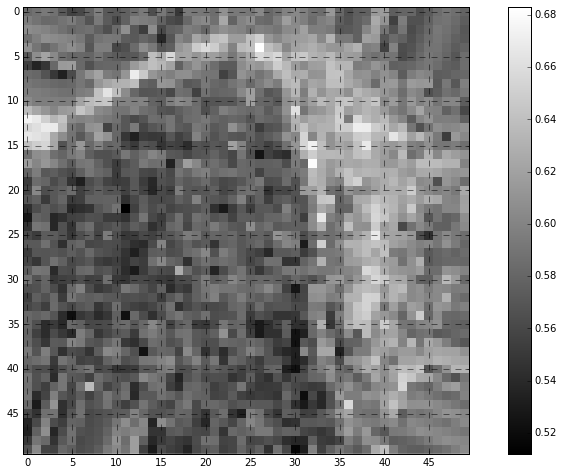

In [518]:
# now plot each image and record which rows should be averaged over for a straight portion
# this will also give me some information about the length distribution in pixels

i = 49
im = tubes[i,...]

fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(1,1,1)
axim = ax.imshow(rotate(im, angles[i], resize=False, mode='nearest'), 
                 cmap = plt.cm.gray, aspect = 'equal', interpolation = 'None')

ax.xaxis.set_major_locator(MultipleLocator(5))
ax.yaxis.set_major_locator(MultipleLocator(5))
ax.xaxis.grid(True, which="major", linestyle='--', color='k')
ax.yaxis.grid(True, which="major", linestyle='--', color='k')

cb = plt.colorbar(axim)

In [519]:
# rows over which to average to find nanotube profiles
prorows = [( 0,50), (13,19), ( 5,34), ( 5,15), (15,45),
           ( 0,30), (35,50), (10,49), ( 3,18), ( 5,30),
           (23,31), (22,50), (16,50), (19,35), ( 6,27),
           ( 6,26), (10,30), ( 5,30), ( 0,50), ( 4,24),
           (20,41), (20,25), ( 6,24), (29,41), ( 6,18), 
           (17,29), (27,39), (31,39), ( 0,14), ( 7,14),
           (20,30), (30,45), (17,32), ( 0,22), ( 5,33),
           (35,50), (27,45), ( 0,15), (23,35), (29,50), 
           (33,50), (25,40), (30,50), ( 5,35), (16,24),
           (30,40), (18,30), ( 8,26), (30,46), (21,33)]

(0, 50)

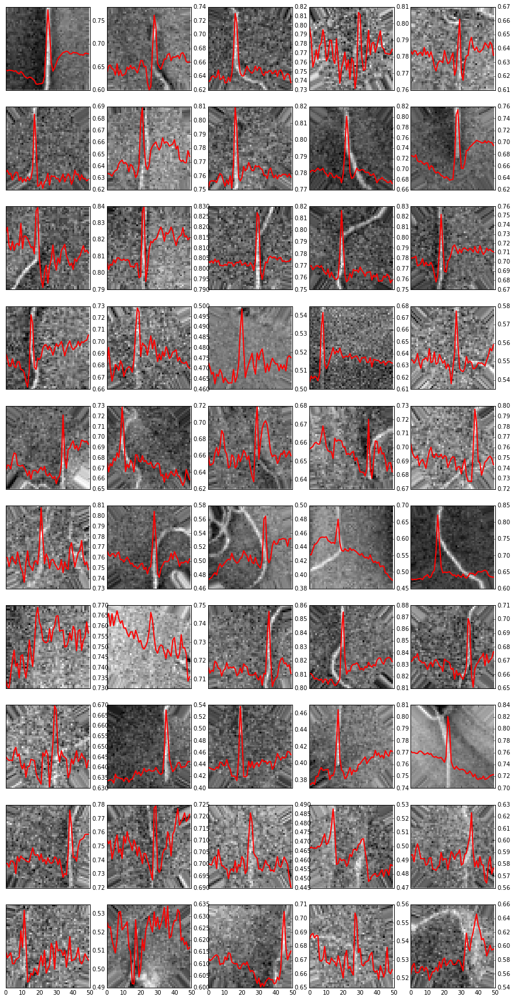

In [592]:
# what a I really want to see are these profiles over laid on the rotated images

fig, axs = plt.subplots(10,5,sharex = True, sharey=False, 
                        figsize=(5*3,10*3))
axs = axs.flat

profiles = np.zeros((50, 50))
for i, im in enumerate(tubes):
    imrot = rotate(im, angles[i], resize=False, mode='nearest')
    profiles[i,:] = np.average(imrot[prorows[i][0]:prorows[i][1], :], axis=0)
    ax = axs[i].twinx()
    axs[i].imshow(imrot, cmap = plt.cm.gray, aspect = 'auto', interpolation = 'None')
    #axs[i].legend(loc='lower right')
    ax.plot(profiles[i], c = 'r', lw = '2')
    axs[i].get_yaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
axs[0].set_xlim(0,50)


18.82 9.98711414672 1.37961372757


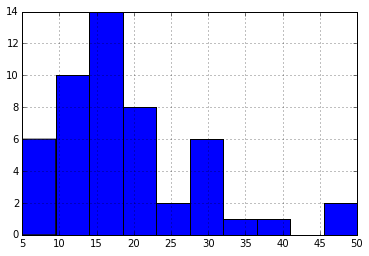

In [561]:
# let's check out a histogram of the lengths of the segments I chose
# along with a few of the moments of the distribution
# this should give me enough information to pick L values for my filter later
# note these are pixel values and 1px ~ 150nm

lengths = pd.Series([p[1]-p[0] for p in prorows])
lengths.hist()
print lengths.mean(), lengths.std(), lengths.skew()

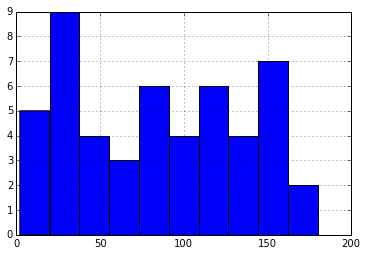

In [564]:
# do the same thing for the angles
# should be pretty flat

angs = pd.Series([a if a > 0 else a+180 for a in angles])
angs.hist()

In [764]:
# here are two possible fitting functions

def sinc(x, a, k, xo, c):
    """ return a sinc function cutoff at +/-2*pi/a """
    if xo<min(x):
        xo=min(x)
    elif xo>max(x):
        xo=max(x)
        
    l = xo - 2.0*np.pi/k
    u = xo + 2.0*np.pi/k
    
    s = np.sin(k*(x-xo))/(k*(x-xo)) # function to start with
    s[xo] = 1 # numpy doesn't know about limits
    s[np.logical_or(x<l,x>u)] = 0
    return a*s - c

def triangle(x, a, k, xo, c):
    """ return just a triangular shaped peak with bottom width, k """
    if xo<min(x):
        xo=min(x)
    elif xo>max(x):
        xo=max(x)
        
    l = xo - k/2.0
    u = xo + k/2.0
    
    s1 = (1/(xo-l))*x + (-l)/(xo-l)
    s2 = (1/(xo-u))*x + (-u)/(xo-u)
    
    s = np.clip(np.append(s1[0:round(xo)],s2[round(xo):]), 0, 1)
    return a*s - c

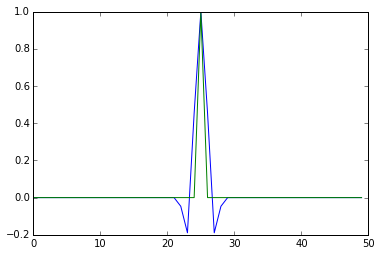

In [765]:
# I like this. This is a good model.
x = np.arange(0,50,1)
plt.plot(x, sinc(x, 1, 2, 25, 0), x, triangle(x, 1, 2, 25, 0))

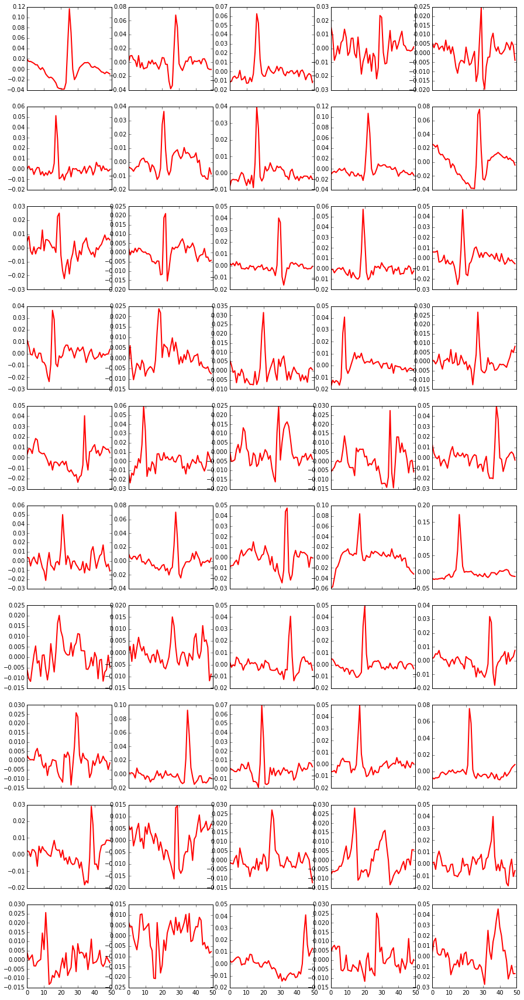

In [603]:
# to fit that peak... subtract background then fit the trial function

# calculate polynomial
x = np.arange(0,50,1)

fig, axs = plt.subplots(10,5,sharex = True, sharey=False, 
                        figsize=(5*3,10*3))
axs = axs.flat

flatpro = np.zeros((50, 50))
for i, p in enumerate(profiles):
    coef = np.polyfit(x, p, 1)
    f = np.poly1d(coef)
    flatpro[i] = p - f(x)
    axs[i].plot(x, flatpro[i], c = 'r', lw = 2)

In [618]:
from scipy.optimize import curve_fit

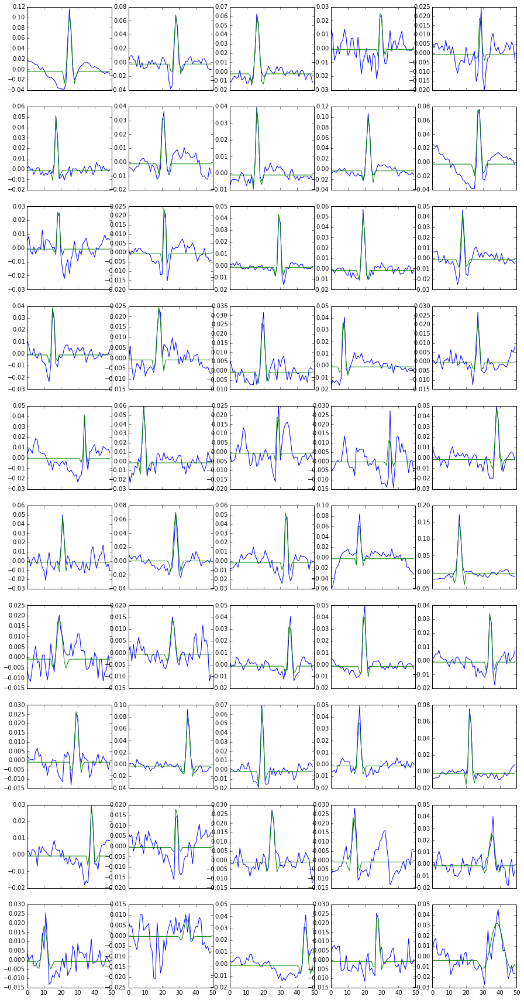

In [806]:
sincparam = np.zeros((len(flatpro),4))
sincsq = np.zeros(len(flatpro))

fig, axs = plt.subplots(10,5,sharex = True, sharey=False, 
                        figsize=(5*3,10*3))
axs = axs.flat

for i in range(len(flatpro)):
    guess = [flatpro[i].max(), 1.5, flatpro[i].argmax(), 0] # initial guess at fit parameters
    params, covars = curve_fit(sinc, x, flatpro[i], p0 = guess)
    sincsq[i] = sum((sinc(x, params[0], params[1], params[2], params[3])-flatpro[i])**2/(len(flatpro[i])-len(guess)))
    sincparam[i,:] = params
    axs[i].plot(x, flatpro[i], x, sinc(x, params[0], params[1], params[2], params[3]))

1.84119479958 0.448996237907 0.0562819045931


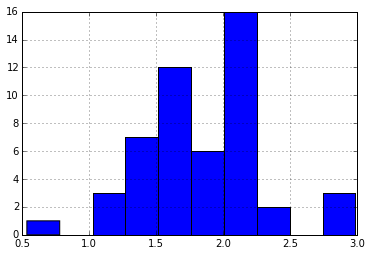

In [752]:
# histogram of k values from sinc fit
# k and L will define the shape of the kernel later

ks = pd.Series(sincparam[:,1])
ks.hist()
print ks.mean(), ks.std(), ks.skew()

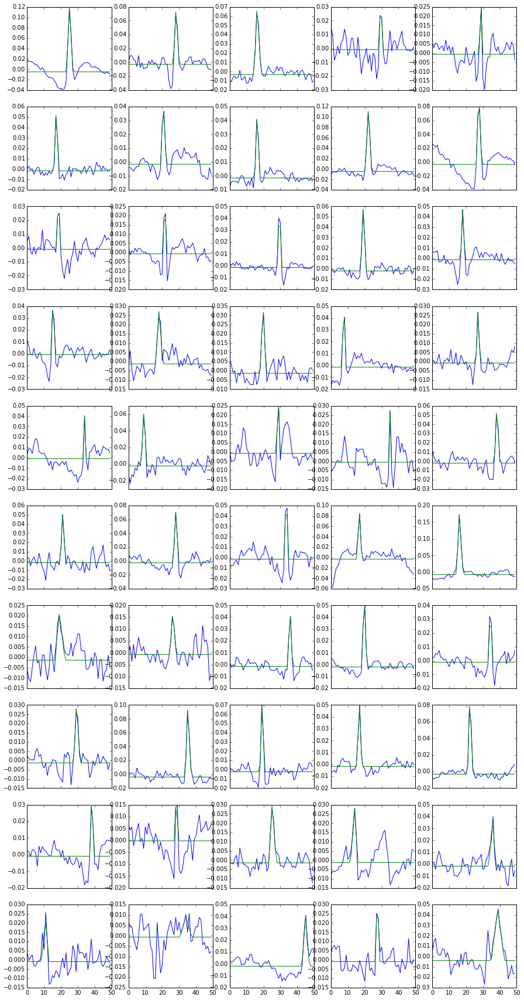

In [803]:
triparam = np.zeros((len(flatpro),4))
trisq = np.zeros(len(flatpro))

fig, axs = plt.subplots(10,5,sharex = True, sharey=False, 
                        figsize=(5*3,10*3))
axs = axs.flat

for i in range(len(flatpro)):
    guess = [flatpro[i].max(), 4, flatpro[i].argmax(), 0] # initial guess at fit parameters
    params, covars = curve_fit(triangle, x, flatpro[i], p0 = guess)
    trisq[i] = sum((triangle(x, params[0], params[1], params[2], params[3])-flatpro[i])**2/(len(flatpro[i])-len(guess)))
    triparam[i,:] = params
    axs[i].plot(x, flatpro[i], x, triangle(x, params[0], params[1], params[2], params[3]))

3.49497511678 1.19508150854 1.5908016081


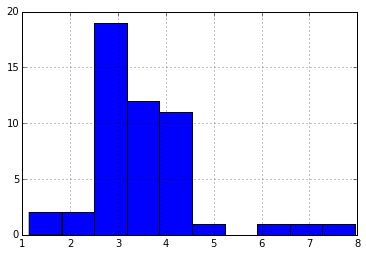

In [804]:
# histogram of k values from triangle fit
# k and L will define the shape of the kernel later

kt = pd.Series(triparam[:,1])
kt.hist()
print kt.mean(), kt.std(), kt.skew()

5.67155061899e-05


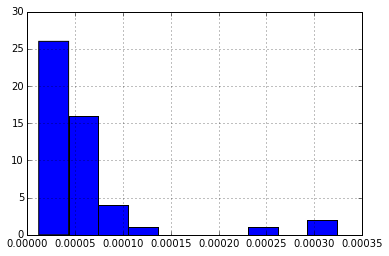

In [808]:
s_trisq = pd.Series(trisq)
s_trisq.hist()
print s_trisq.mean()

5.70399739434e-05


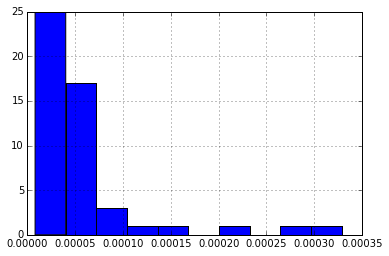

In [809]:
s_sincsq = pd.Series(sincsq)
s_sincsq.hist()
print s_sincsq.mean()

These two models seem to give pretty much identical results. I might just have to see which one works better as a filter.

In [816]:
# save variables for later
import pickle

pickle.dump(filelist, open( "filelist.p", "wb" )) # filenames used in test set in the correct order
pickle.dump(cntloc, open( "cnt_locations.p", "wb" )) # two tubes from each filename
pickle.dump(angles, open( "cnt_angles.p", "wb" )) # rotation angle for each item in 'tubes'
pickle.dump(prorows, open( "profile_rows_to_avg.p", "wb" )) # rows to average over in rotated 'tubes' images

np.save('individual_cnt_imgs.npy', tubes) # not rotated, individual tube images
np.save('individual_cnt_profiles.npy', profiles) # extracted profiles
np.save('background_subtracted_cnt_profiles', flatpro) # extracted profiles with linear background removed